# Modify surface data map - REALISTIC CASE

In [1]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib as mpl
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

import sys; sys.path.append("..")
from dataset_manipulation import *
from surfdatamaplib import *
from lpjguess import *

## Import data

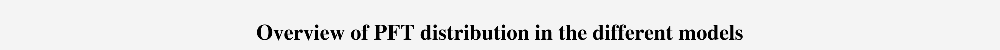

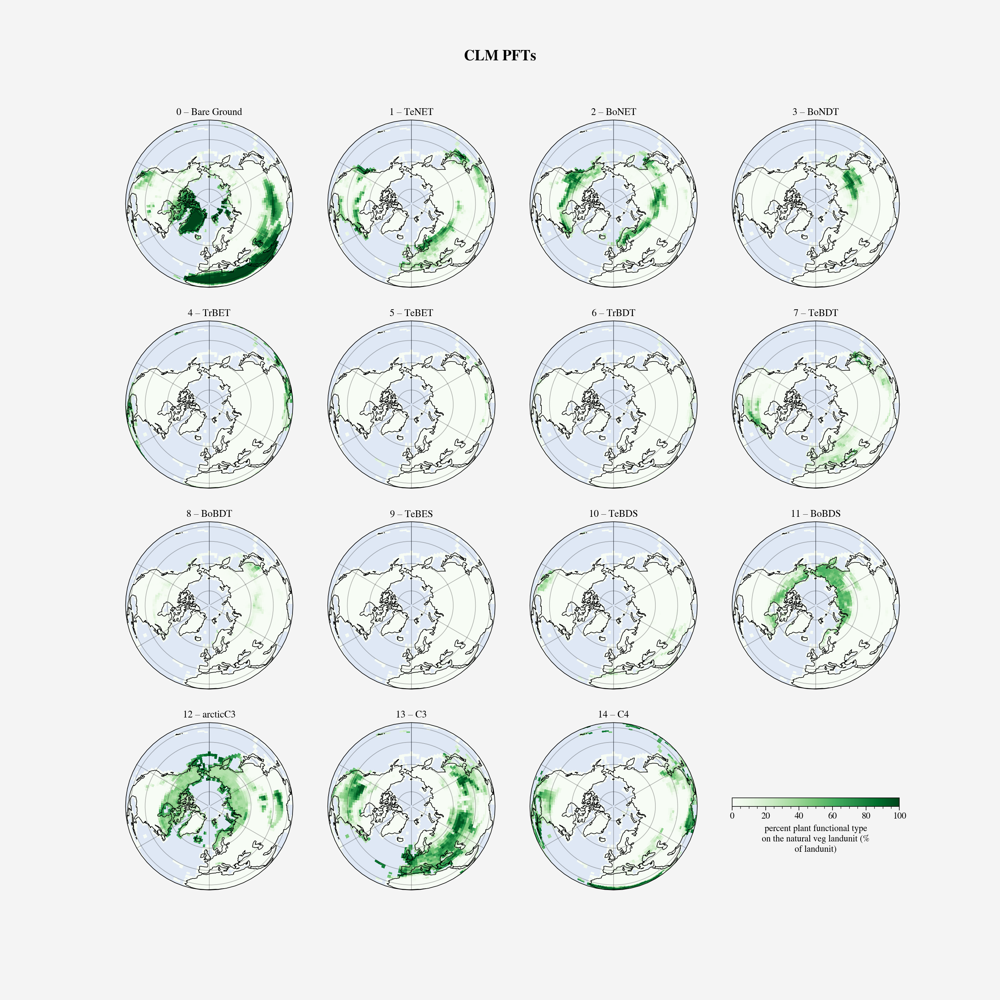

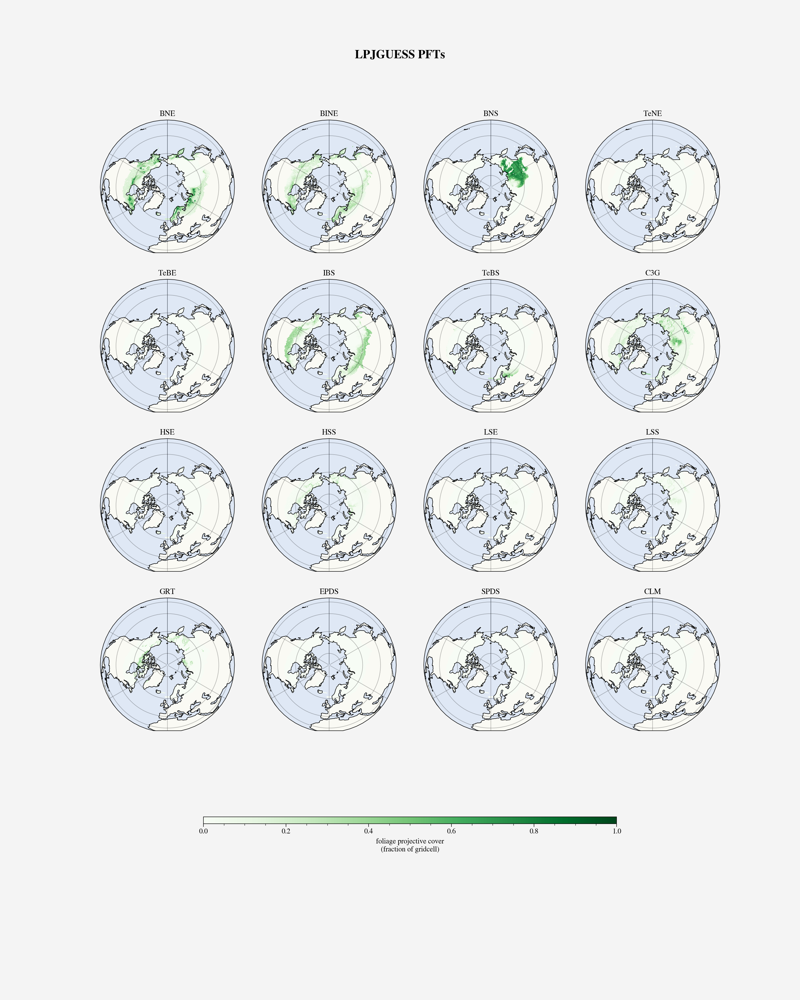

In [4]:
# Import original surfdata file
fn_in='surfdata_1.9x2.5_hist_78pfts_CMIP6_simyr2000_c190304'
fn = '../../data/surfdatamap/'+fn_in + '.nc'
dset_in = xr.open_dataset(fn)

# Load pfts in CLM (from previous analysis)
folder_out='/Users/adelezaini/Desktop/master-thesis/processed-data/input/'
pfts_CLM = xr.open_dataset(folder_out+'IDEALIZED/pfts_CLM.nc'); pfts_CLM = pfts_CLM.PCT_NAT_PFT

# Filter DataArray by the land cover (to have ocean grid cells marked as NaN instead of 0)
lnd_frac = xr.open_dataset(folder_out+'IDEALIZED/lndfrac_CLM.nc'); lnd_frac = lnd_frac.LANDFRAC_PFT
lnd_frac = lnd_frac.where(lnd_frac<=1.,1.) # There are values above 1. -> replace with 1.
pfts_CLM = pfts_CLM.where(lnd_frac>0.)

titles = ["1 – TeNET","2 – BoNET","3 – BoNDT", "5 – TeBET", "7 – TeBDT", "8 – BoBDT", "11 – BoBDS","12 – aC3"]
pftnames_CLM = {0:'Bare Ground', 1:'TeNET', 2:'BoNET', 3:'BoNDT', 4:'TrBET', 5:'TeBET', 6:'TrBDT', 
             7:'TeBDT', 8:'BoBDT', 9:'TeBES', 10:'TeBDS', 11:'BoBDS', 12:'arcticC3', 13:'C3', 14:'C4'}
plot_title('Overview of PFT distribution in the different models')
plot_boreal_pfts(pfts_CLM, col_wrap=4, title = "CLM PFTs", titles=dict_to_legend(pftnames_CLM))

# Future veg distribution from LPJGUESS - under SSP85 and as GCM GFDL-ESM4
fn = 'GFDL-ESM4_SSP585_fpc2071to2100.txt'
fn_path = '../../data/LPJ-GUESS/FPC/'+fn
pfts_GFDL = DataArray_from_LPJGUESS(fn_path, name='FPC_PFT', colnames=False, da_attrs=pfts_CLM,
                               main_attrs = {'long_name': 'foliage projective cover (fraction of gridcell)'})
pftnames = pftnames_LPJGUESS('../../data/LPJ-GUESS/FPC/fpc1971to2000.txt')

#Select just natural PFTs and not peatland ones
pfts_GFDL = pfts_GFDL.isel(natpft=slice(0,16))

plot_boreal_pfts(pfts_GFDL, titles = pftnames, col_wrap=4, title = "LPJGUESS PFTs", lat=1., extra_cbar_axis=True)

## Convert LPJGUESS data into CLM format: regrid, normalize over landunit, convert PFTs

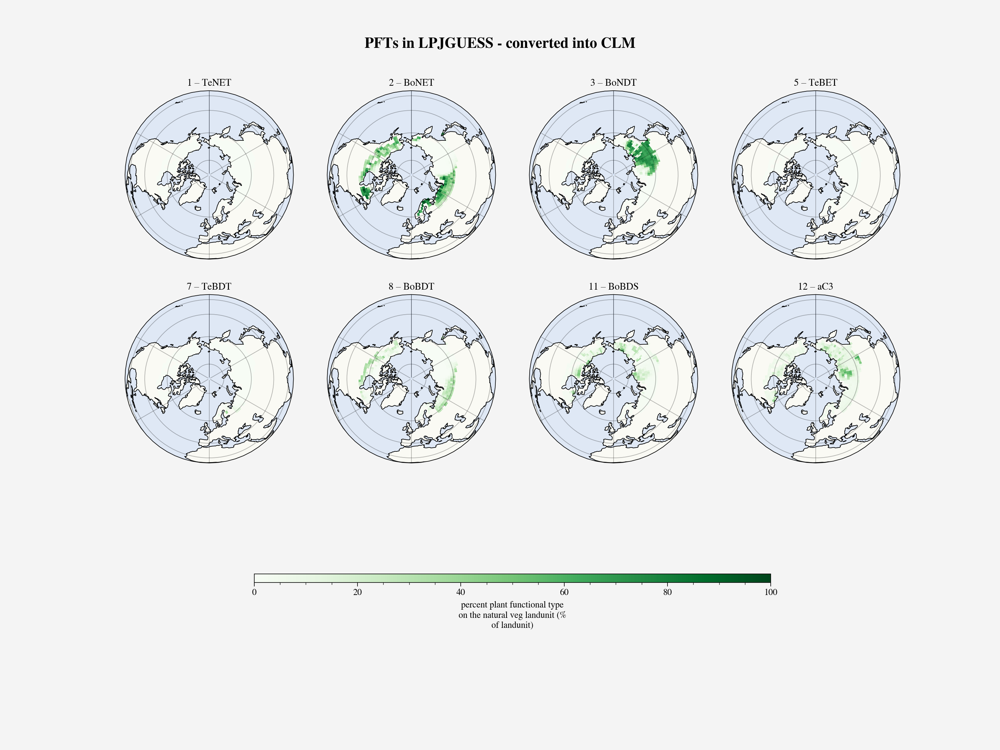

In [5]:
# Regrid LPJGUESS
pfts_GFDL_coarse = match_coord(pfts_GFDL, pfts_CLM)
#plot_boreal_pfts(pfts_GFDL_coarse,title = "PFTs in LPJGUESS - coarse", col_wrap=4, extra_cbar_axis=True)

# Rescale on landunit (CLM is in landunit)
pfts_GFDL_lndunit = convert_gridcell_to_landunit(pfts_GFDL_coarse, lnd_frac,
                                                 attrs=dict(long_name = pfts_CLM.long_name))

# Plot the difference: hard to see but there are some differences in the coastline. 
# Since LPJGUESS area cover just land, hard that when converted it has values on the coastline, 
#it's then hard to find the different gridcell on the map
#diff = pfts_GFDL_coarse - pfts_GFDL_lndunit
#plot_boreal_pfts(diff.where(diff!=0.),title = "PFTs in LPJGUESS - landunit",  figsize=[12,15],
                 #col_wrap=4, cmap='burd', vmin=-0.05, vmax = 0.05, levels=11)

# Convert PFT from LPJGUESS to CLM
pfts_GFDL_converted = PFT_convert_LPJGUESS_to_CLM(CLM_pfts = pfts_CLM, LPJGUESS_pfts = pfts_GFDL_lndunit)
# There is value >100. ->100.
pfts_GFDL_converted = pfts_GFDL_converted.where(pfts_GFDL_converted<=100., 100.).where(pfts_GFDL_converted.notnull())
plot_boreal_pfts(pfts_GFDL_converted,title = "PFTs in LPJGUESS - converted into CLM", col_wrap=4, vmax = 100.,
                 extra_cbar_axis=True, titles = titles)

### Change in LPJGUESS_SSP85 - CLM_2000

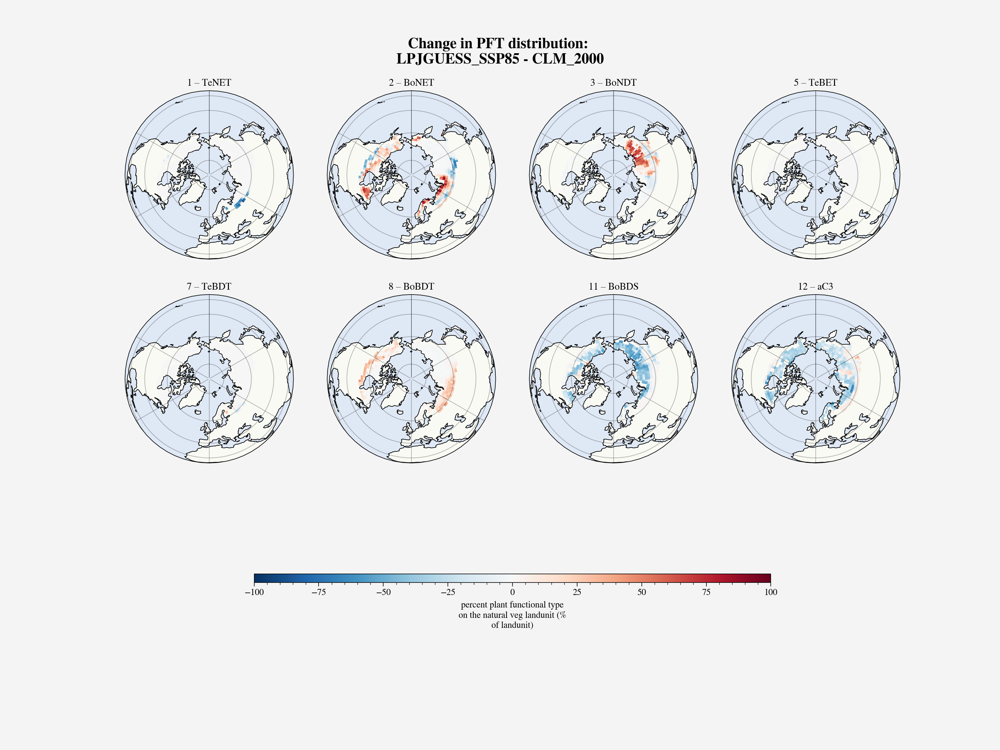

In [6]:
plot_boreal_pfts(pfts_GFDL_converted - pfts_CLM.sel(natpft = pfts_GFDL_converted.natpft).where(pfts_GFDL_converted>=0.),
                 title = "Change in PFT distribution: \nLPJGUESS_SSP85 - CLM_2000", cmap='burd',
                 col_wrap=4, extra_cbar_axis=True, titles = titles)
#plot_boreal_pfts(pfts_CLM.sel(natpft = pfts_GFDL_converted.natpft).where(pfts_GFDL_converted>=0.),
                 #title = "CLM PFTs - selected", titles = titles, col_wrap=4, extra_cbar_axis=True)

First of all, we need to remember that the two distributions come from two different models, so the plotted change takes into count differences in modelling (ex: the negative change in TeNET is simply due to this, there is no real decrease). A solution could be the following. Instead of replacing the values from LPJGUESS onto CLM configuration - just in the area of interested -, we **apply the change** observed in LPJGUESS on CLM configuration.

### Change in LPJGUESS_SSP85 - LPJGUESS_hist

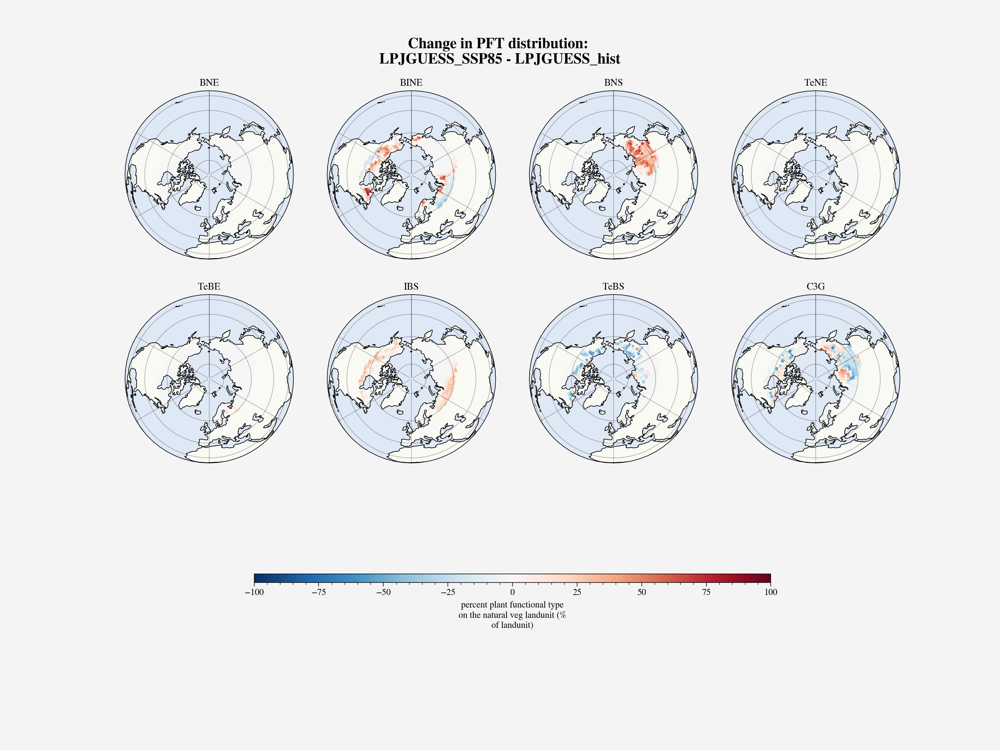

In [8]:
# Import historical data from LPJGUESS (sliced 1971-2000)
fn = 'fpc1971to2000.txt'
fn_path = '../../data/LPJ-GUESS/FPC/'+fn
pfts_hist = DataArray_from_LPJGUESS(fn_path, name='FPC_PFT', colnames=False, da_attrs=pfts_CLM,
                               main_attrs = {'long_name': 'foliage projective cover (fraction of gridcell)'})
#Select just natural PFTs and not peatland ones
pfts_hist= pfts_hist.isel(natpft=slice(0,16))
#plot_boreal_pfts(pfts_hist, titles = pftnames, col_wrap=4, extra_cbar_axis=True,
                 #title = "LPJGUESS PFTs - historical (1971-200)")
    
# Regrid LPJGUESS
pfts_hist_coarse = match_coord(pfts_hist, pfts_CLM)
# Rescale on landunit (CLM is in landunit)
pfts_hist_lndunit = convert_gridcell_to_landunit(pfts_hist_coarse, lnd_frac,
                                                 attrs=dict(long_name = pfts_CLM.long_name))
# Convert PFT from LPJGUESS to CLM
pfts_hist_converted = PFT_convert_LPJGUESS_to_CLM(CLM_pfts = pfts_CLM, LPJGUESS_pfts = pfts_hist_lndunit)
# There is value >100. ->100.
#pfts_hist_converted = pfts_GFDL_converted.where(pfts_hist_converted<=100., 100.).where(pfts_hist_converted.notnull())

# Plot the change
plot_boreal_pfts(pfts_GFDL_converted-pfts_hist_converted, title = "Change in PFT distribution: \nLPJGUESS_SSP85 - LPJGUESS_hist", 
                 cmap='burd', col_wrap=4, extra_cbar_axis=True, titles = pftnames)

In [ ]:


#Note there is a single value that after the regriding exceed 100 (natpft=2, lat=69.16, lon=35.)
#Pribably linked all the manipulation: 1. regrid LPJ grid to CLM grid, 
#2. sum of BNE+BINE in a single pft 3. convert into lndgrid
#Fix manually
pfts_converted_lndunit = pfts_converted_lndunit.where(pfts_converted_lndunit<=100., 100.).where(pfts_converted_lndunit>=0.)


# Apply modification to the original surfdata map
ds = surfdatamap_modification(original_ds = dset_in, pfts_tot = pfts_CLM, edited_pfts = pfts_converted_lndunit, method = 'irregular_area')
# Save the new edited surfdatafile
ds.load().to_netcdf(folder_out+'REALISTIC/'+fn_in+'_historical.nc')

In [ ]:
e = convert180_360(convert_lsmcoord(ds)).PCT_NAT_PFT.sel(natpft=[1,2,3,5,7,8,11,12])
plot_boreal_pfts(e, title ="New configuration in CLM", col_wrap=3)
d = convert180_360(convert_lsmcoord(dset_in)).PCT_NAT_PFT.sel(natpft=[1,2,3,5,7,8,9,11,12])
plot_boreal_pfts((e-d), title ="Change in boreal PFT configuration -in the original format-", 
                 cmap='burd',col_wrap=3)